# ICM Speech Analytics Insights Dashboard

## Housekeeping Items

### Warning Message Configuration

In [1]:
#Warning message configuration
import logging, sys
logging.disable(sys.maxsize)
import warnings
warnings.filterwarnings('ignore')

### Loading Libraries

In [2]:
#%%time

from __future__ import print_function

import gc
gc.enable()

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from textwrap import wrap
#%matplotlib inline

#load libraries
import math
import statistics as st
import statsmodels.api as sm
from statsmodels.formula.api import ols

#!pip install researchpy
import researchpy as rp 
import scipy.stats as stats


from ipywidgets import interact,interactive, fixed, interact_manual
from IPython.core.display import display, Markdown,HTML

import ipywidgets as widgets
import plotly.express as px
import plotly.graph_objects as go
# import ipyvuetify as v

#for heat map
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
from mpl_toolkits.axes_grid1.colorbar import colorbar

#for chart
import altair as alt

### Setting Seed

In [3]:
import random
random.seed(1234)

### Print Output with Markdown Formatting

In [4]:
#setting up output formatting
def printmd(string):
    display(Markdown(string))

# Read & Preprocess Input 

## Set path for local directory

In [5]:
# %%time
# #set path and variables for data file
# import os

# base_path = "D:/Speech Analytics/ICM/"
# filename = "ICM_cons_csv.csv"
# path_to_file = os.path.join(base_path, filename)
# fd = open(path_to_file , 'r')
# #base_path
# #fd

## Read input File

In [6]:
# %%time
# # Load in the data with `read_csv()`
# sa = pd.read_csv(fd, encoding = 'unicode_escape')
# #sa.shape


## Remove Unnecssary Columns

In [7]:
# %%time
# gc.collect()
# #drop rows with all cells empty
# # Drop rows with any empty cells
# sa.dropna(how="all", inplace=True)
# sa.dropna(how='all', axis=1)

# #remove unecessary columns
# #sa_temp = sa.copy()

# mydrop_list = [ #"No.",
#                 #"E",
#                 "COVID 19",
#                 "COVID 19 - Inverse",
#                 "ICM - Agent Knowledge",
#                 "ICM - Agent Knowledge Positive",
#                 "ICM - All TCD",
#                 "ICM - Assurance",
#                 "ICM - Authenticate",
#                 "ICM - Call Back - Agent Promising",
#                 "ICM - Call Back - Agent Requesting",
#                 "ICM - Call Back - Customer Says",
#                 "ICM - Call Back Committment",
#                 "ICM - Call Disconnects",
#                 "ICM - Cold Transfer",
#                 "ICM - Communication Issues",
#                 "ICM - Communication Skills - Native Language",
#                 "ICM - Communication Skills - Understandability",
#                 "ICM - Communication Skills - Understanding Customer",
# #                "ICM - CSAT",
#                 "ICM - CSAT END",
#                 "ICM - CSAT Start",
#                 "ICM - Customer Education",
#                 "ICM - Dispatch Spiel",
# #                "ICM - DSAT",
#                 "ICM - DSAT END",
#                 "ICM - DSAT START",
# #                "ICM - Escalation - Above Supervisor Level",
#                 "ICM - Escalation - Agents Reason",
#                 "ICM - Escalation All",
# #                "ICM - Escalation by Customer",
#                 "ICM - Escalation Reason",
#                 "ICM - Friendly Closure",
#                 "ICM - Further Assistance",
#                 "ICM - Gain Agreement",
#                 "ICM - Genuine Hello",
#                 "ICM - Hold Procedure - Customer Annoyed",
#                 "ICM - Hold Procedure - Thanking the customer",
#                 "ICM - Hold Procedure - Valid Reason",
#                 "ICM - Loyalty - Agents Branding",
#                 "ICM - Loyalty - Customer Branding",
#                 "ICM - Missed Commitment",
#                 "ICM - MonForm  - Personalize Solutions - Keep Positive",
#                 "ICM - MonForm - Gain Agreement - Recap The Solution",
#                 "ICM - MonForm - Thoroughly Educate - Digital",
#                 "ICM - MonForm - Warmly Welcome - Ask How You Can Help",
#                 "ICM - MonForm - Warmly Welcome - Greet Friendly",
#                 "ICM - MonForm - Warmly Welcome - Introduce By Name",
#                 "ICM - MonForm - Warmly Welcome - Responded I Can Help",
#                 "ICM - Payments",
#                 "ICM - Personalization",
#                 "ICM - Post Call Survey",
#                 "ICM - Probe for Cancellation",
#                 "ICM - Probing",
#                 "ICM - Promise/Loyalty",
#                 "ICM - Quick Recap",
#                 "ICM - Rapport Building",
#                 "ICM - Rate of Speech",
#                 "ICM - Redo Steps",
# #                "ICM - Repeat Caller",
# #                "ICM - Resolution Script",
#                 "ICM - Resolution Script - Inverse",
#                 "ICM - Setting Expectation",
#                 "ICM - Spiel Temp check",
#                 "ICM - Supervisor Listening",
#                 "ICM - Take Ownership",
# #                 "ICM - TCD - All Product Issues - All Prod Info",
# #                 "ICM - TCD - All Product Issues - All Prod Intermittent",
# #                 "ICM - TCD - All Product Issues - All Prod No Svc",
# #                 "ICM - TCD - All Product Issues - All Prod Special Req",
# #                 "ICM - TCD - Dispatch",
# #                 "ICM - TCD - Email - Email",
# #                 "ICM - TCD - Ghost Call - Ghost Call",
# #                 "ICM - TCD - Internet Issues - Internet Impaired",
# #                 "ICM - TCD - Internet Issues - Internet Info",
# #                 "ICM - TCD - Internet Issues - Internet No Svc",
# #                 "ICM - TCD - L4 - Ghost Call",
# #                 "ICM - TCD - Misdirect - Misdirect",
# #                 "ICM - TCD - Phone Issues - Phone Info",
# #                 "ICM - TCD - Phone Issues - Phone No Svc",
# #                 "ICM - TCD - Suspend WFE Session - Suspend WFE Session",
# #                 "ICM - TCD - TV Issues - TV Impaired",
# #                 "ICM - TCD - TV Issues - TV No Svc",
# #                 "ICM - TCD - WMT - Repair Pre Due Date",
# #                 "ICM - Transfer",
#                 "ICM - Transfers - Billing Team",
#                 "ICM - Transfers - Direc TV",
#                 "ICM - Transfers - Mobility Support",
#                 "ICM - Transfers - Repair Team",
#                 "ICM - Transfers - Retention Team",
#                 "ICM - Warm Transfer",
#                 "ICM - Welcome Greeting",
#                 "Inverse - Keep It Positive",
# #                 "Tarlac - Dispatch Disclosure – $99 fee",
# #                 "Tarlac - MYATT App Education",
# #                 "Tarlac - Sequential Reboot process",
# #                 "Tarlac - Tech Visit Done - Issue Still not Resolved",
# #                 "Tarlac - Technician Appointment Education",
# #                 "Tarlac - Where is my Tech",
# #                 "Tarlac - Wiring Connection check",
#                 "WAH - Background Noise",
#                 "ANI",
#                 "Call Disconnection Side",
#                 "Contact ID",
# #                 "Customer Talk-Time %",
# #                 "Direction",
#                 "DNIS",
# #                 "Duration (sec)",
# #                 "Employee",
#                 "Employee ID",
# #                 "Employee Talk-Time %",
#                 "Exception Interaction",
#                 "Extension",
#                 "Global Call UCID",
# #                 "Local Start Time",
#                 "Number of Conferences",
#                 "Number of Holds",
#                 "Number of Transfers",
#                 "PBX ID",
#                 "Screen",
#                 "SID Key",
# #                 "Silence-Time %",
#                 "Skill",
#                 "Switch",
#                 "Switch call ID",
# #                 "Talk-Over-Time %",
# #                 "Total Customer Talk-Time (sec)",
# #                 "Total Employee Talk-Time (sec)",
# #                 "Total Hold Time (sec)",
# #                 "Total Silence-Time (sec)",
# #                 "Total Talk-Over-Time (sec)",
#                 "Trunk",
#                 "Wrap-up Time (sec)"
#                 ]

# sa = sa.drop(axis=1, labels=mydrop_list)

# #drop columns by list
# reg_list= ['Tarlac']

# def reg_drop(reg_list):
#     for i in range(len(reg_list)):
#         sa= sa.drop(sa.filter(like=reg_list,axis=1).columns,axis=1)


## Remove Space in Column Names

In [8]:
# %%time
# #remove space in column headers
# sa.columns = sa.columns.str.replace(' ', '')

# gc.collect()
# #check the dimension
# #sa.shape

## Convert Seconds Column to Minutes

In [9]:
# %%time
# #creating Minutes Column
# # sa = sa.copy()
# sa['AHT_Min'] = (sa['Duration(sec)']/60)
# sa['EmpTalkTime_Min'] = (sa['TotalEmployeeTalk-Time(sec)']/60)
# sa['SilenceTime_Min'] = (sa['TotalSilence-Time(sec)']/60)
# sa['CustomerTalkTime_Min'] = (sa['TotalCustomerTalk-Time(sec)']/60)
# sa['TalkOverTime_Min'] = (sa['TotalTalk-Over-Time(sec)']/60)
# sa['HoldTime_Min'] = (sa['TotalHoldTime(sec)']/60)

# #check the dimension
# sa.shape

## Convert Duration Related Percentage Columns as Floats

In [10]:
# %%time
# #convert % columns as floats 
# cols = ['Silence-Time%', 'EmployeeTalk-Time%','CustomerTalk-Time%','Talk-Over-Time%']

# for i in range(len(cols)):
#     sa[cols[i]] = sa[cols[i]].astype('str') 
#     sa[cols[i]]= sa[cols[i]].str.replace(r'\%', '').astype(float)

# gc.collect()
# #check the dimension
# sa.shape

## Create Month & Records Count Column

In [11]:
# %%time
# #Create Month Column and Records Count Column
# # sa= sa.copy()
# sa['LocalStartTime'] = pd.to_datetime(sa['LocalStartTime'])
# sa['Month'] = sa.LocalStartTime.dt.month_name()
# #type(sa['Month'])
# sa['Count_Records'] = pd.to_numeric(np.where(sa['Direction']!='',1,0))
# #sa.head(2)

# gc.collect()
# #check the dimension
# #sa.shape

## Create Additonal Columns (Repeat Call Count, Escalation Count, Transfer Count)

In [12]:
# %%time
# #filling na with empty space for the columns of interest
# cols=['ICM-RepeatCaller',
#       'ICM-Escalation-AboveSupervisorLevel',
#       'ICM-EscalationbyCustomer',
#       'ICM-Transfer']

# sa[cols] = sa[cols].apply(pd.to_numeric, errors='coerce', axis=1)

# new_cols = ['Repeat_Call','Escalation_Customer','Escalation_Above_Supervisor','Transfer_Count']

# for i in range(len(new_cols)):
#     sa[new_cols[i]]= np.where(sa[cols[i]]>=th, 1,0)
    
# # sa = sa.copy()    
# sa['Escalation_Count'] = sa['Escalation_Customer']+sa['Escalation_Above_Supervisor']
# gc.collect()

## Create TCD Columns

##### Filling TCD columns' Na with Zero & Converting to Numeric

In [13]:
# %%time
# #filling na with empty space for the columns of interest

# # sa = sa.copy()

# cols=['ICM-TCD-AllProductIssues-AllProdInfo',
#       'ICM-TCD-AllProductIssues-AllProdIntermittent',
#       'ICM-TCD-AllProductIssues-AllProdNoSvc',
#       'ICM-TCD-AllProductIssues-AllProdSpecialReq',
#       'ICM-TCD-Dispatch',
#       'ICM-TCD-Email-Email',
#       'ICM-TCD-GhostCall-GhostCall',
#       'ICM-TCD-InternetIssues-InternetImpaired',
#       'ICM-TCD-InternetIssues-InternetInfo',
#       'ICM-TCD-InternetIssues-InternetNoSvc',
#       'ICM-TCD-L4-GhostCall',
#       'ICM-TCD-Misdirect-Misdirect',
#       'ICM-TCD-PhoneIssues-PhoneInfo',
#       'ICM-TCD-PhoneIssues-PhoneNoSvc',
#       'ICM-TCD-SuspendWFESession-SuspendWFESession',
#       'ICM-TCD-TVIssues-TVImpaired',
#       'ICM-TCD-TVIssues-TVNoSvc',
#       'ICM-TCD-WMT-RepairPreDueDate']


# sa[cols] = sa[cols].apply(pd.to_numeric, errors='coerce', axis=1)

# gc.collect()
# #check the dimension
# #sa.shape

##### Creating new TCD column

In [14]:
# %%time
# #Creating new TCD column
# new_cols = ['AllProd_Info',
#             'AllProd_Intermittent',
#             'AllProd_NoSvc',
#             'AllProd_SpecialReq',
#             'Dispatch_',
#             'Email_',
#             'Ghost_Call',
#             'Internet_Impaired',
#             'Internet_Info',
#             'Internet_NoSvc',
#             'GhostCall_L4',
#             'Misdirect_',
#             'Phone_Info',
#             'Phone_NoSvc',
#             'Suspend_WFE_Session',
#             'TV_Impaired',
#             'TV_NoSvc',
#             'Repair_Pre_DueDate']

# for i in range(len(new_cols)):
#     sa[new_cols[i]]= np.where(sa[cols[i]]>=th, new_cols[i], '')

# #Create TCD Column
# sa['TCD'] = ''
# sa['TCD'] = sa[new_cols].apply(lambda x: '-'.join(x), axis = 1) 
# #sa['TCD'].value_counts()

# # # drop the rows with no values in TCD column 
# # indexNames = sa[(sa['TCD'] == '-----------------')].index
# # sa.drop(indexNames , inplace=True)


# #Replace empty hyphens
# sa['TCD'].replace('-------------','',inplace=True,regex=True)
# sa['TCD'].replace('-----','',inplace=True,regex=True)
# sa['TCD'].replace('----','',inplace=True,regex=True)
# #sa['TCD'].replace('---','--',inplace=True,regex=True)
# #sa['TCD'].replace('-','',inplace=True,regex=True)
# len(sa['TCD'].value_counts())

# #check the dimension
# #sa.shape

## Create Employee TCD Combination

In [15]:
# sa['Emp_TCD'] = sa['Employee'].astype(str)+ sa['TCD'].astype(str)

## Write preprocessed File to Local Disk

In [16]:
# sa.to_csv('processed_icm_cons.csv',index=False)

## Read Preprocessed Consolidated File from Local Disk

In [17]:
sa = pd.read_csv('processed_icm_cons.csv', encoding = 'unicode_escape')

## Create List of Months for which Data is Available

In [18]:
#month_list = sa.Month.to_list()
month_list = sa.Month.unique().tolist()
month_list

['January', 'February', 'March']

## Define Threshold for Speech Analytics Porbability

In [19]:
#create threshold
th = 0.89

# Filtering data for Incoming Calls & Month

In [20]:
#%%time
#Filter by Direction
sa_inc = sa[sa['Direction']=='Incoming']
#len(sa_inc)
#sa_inc.shape
def is_latest_month():
    df_latest_month = sa_inc[sa_inc['Month']==month_list[-1]]
#     df_latest_month = sa_inc[is_latest_month]
    return df_latest_month

## Create function to find top 6 TCD list

In [21]:
def tcd_list_6():
    df_temp_inc = sa_inc.copy()
    indexNames = df_temp_inc[(df_temp_inc['TCD'] == '')].index
    df_temp_inc.drop(indexNames , inplace=True)

    t = rp.summary_cat(df_temp_inc['TCD'])
    t = t.drop(['Variable'], axis = 1)
    t = t.rename(columns={'Outcome':'TCD'})
    tcd_list_6 = t.TCD.head(6).tolist()
    return tcd_list_6

# Explore Data

## Summary of Call Types

In [22]:
#%%time
df_summ = rp.summary_cat(sa['Direction'])
df_summ = df_summ.drop(['Variable'], axis = 1)
df_summ = df_summ.rename(columns={'Outcome':'Direction'})

printmd('#### Summary of Call Counts by Call Types & Contribution Percentage')

display(df_summ)

#### Summary of Call Counts by Call Types & Contribution Percentage

,Direction,Count,Percent
0,Incoming,143178,55.07
1,Outgoing,108990,41.92
2,Unknown,5464,2.10
3,Internal,2372,0.91


In [23]:
# #chart to show call type volume
# fig = px.scatter(df_summ, x = 'Direction', y = 'Count', size='Percent',
#                  color = 'Direction',hover_name = 'Direction',size_max=60)
# fig.update_layout(title = 'Call Type (For values, Move your cursor over the line marker)')
# fig.show()

In [24]:
#Altair chart to show call types
printmd('#### Call Types & Contribution in Percentage for the months of')
print(month_list)

source = df_summ

alt.Chart(source).mark_point(filled=True).encode(
    x='Direction',
    y='Count',
    size='Percent'
   
    
).properties(
    width=800,
    height=300
#     title = 'Call Types & Contribution in Percentage'
)

#### Call Types & Contribution in Percentage for the months of

['January', 'February', 'March']


alt.Chart(...)

## Month on Month Call Trend By Call Types

In [25]:
#%%time
#Create Pivot table 
by_month = pd.pivot_table(sa,
                          values='Count_Records',
                          index = ['Direction'],
                          columns=['Month'],
                          aggfunc=np.sum)

by_month = by_month.reindex(columns=sa.Month.unique())

#converting pivot to df
by_month = by_month.reset_index().rename_axis(None, axis=1)
printmd('**Month on Month Volume By Call Type**')
by_month

**Month on Month Volume By Call Type**

,Direction,January,February,March
0,Incoming,49463,53338,40377
1,Internal,773,919,680
2,Outgoing,35969,38940,34081
3,Unknown,1768,2160,1536


## Month on Month Incoming Call Trend

In [26]:
#Altair Line Chart of the Incoming Call Trend
source = sa_inc.groupby(sa['Month'])['Count_Records'].agg(sum).to_frame().reset_index()
printmd('#### Incoming Calls Trend by Month')
alt.data_transformers.disable_max_rows()
line = alt.Chart(source).mark_line().encode(
    x='Month',
    y='Count_Records',
    text='Count_Records:Q'
    
).properties(
    width=800,
    height=300
)
text = line.mark_text(
    align='left',
    #baseline='middle',
    #dx=3  # Nudges text to right so it doesn't appear on top of the bar
).encode(
    text='Count_Records:Q'
)
(line+text)

#### Incoming Calls Trend by Month

alt.LayerChart(...)

## Top 6 TCD Vs. Few Metrics For Latest Month (Incoming Calls)

In [27]:
%%time
printmd('#### Top 6 TCD Vs. Few Metrics For Latest Month (Incoming Calls)')
tcd_list_6 = tcd_list_6()
df_table = is_latest_month()

#Find Transfer Percent 
tc = df_table.groupby(df_table['TCD'])['Transfer_Count'].agg(sum)
tcsum = df_table.groupby(df_table['TCD'])['Count_Records'].agg(sum)
Transfer_Percent = round(tc/tcsum*100,2).to_frame().reset_index()
Transfer_Percent = Transfer_Percent.rename(columns={0:'Transfer_Percent'})

#find Repeat Call Percent
rc = df_table.groupby(df_table['TCD'])['Repeat_Call'].agg(sum)
tcsum = df_table.groupby(df_table['TCD'])['Count_Records'].agg(sum)
RepeatCall_Percent = round(rc/tcsum*100,2).to_frame().reset_index()
RepeatCall_Percent = RepeatCall_Percent.rename(columns={0:'RepeatCall_Percent'})

#Find Escalation Percent
ec = df_table.groupby(df_table['TCD'])['Escalation_Count'].agg(sum)
tcsum = df_table.groupby(df_table['TCD'])['Count_Records'].agg(sum)
Escalation_Percent = round(ec/tcsum*100,2).to_frame().reset_index()
Escalation_Percent = Escalation_Percent.rename(columns={0:'Escalation_Percent'})

#find SilenceTime Percent
SilenceTime_Percent = df_table.groupby(df_table['TCD'])['Silence-Time%'].agg('mean').round(2)
SilenceTime_Percent  = SilenceTime_Percent.to_frame().reset_index()
SilenceTime_Percent  = SilenceTime_Percent.rename(columns={'Silence-Time%':'SilenceTime_Percent'})

#find Customer Talk Percent
CustomerTalk_Percent = df_table.groupby(df_table['TCD'])['CustomerTalk-Time%'].agg('mean').round(2)
CustomerTalk_Percent  = CustomerTalk_Percent.to_frame().reset_index()
CustomerTalk_Percent  = CustomerTalk_Percent.rename(columns={'CustomerTalk-Time%':'CustomerTalk_Percent'})

#find Customer Talk Percent
EmployeeTalk_Percent = df_table.groupby(df_table['TCD'])['EmployeeTalk-Time%'].agg('mean').round(2)
EmployeeTalk_Percent  = EmployeeTalk_Percent.to_frame().reset_index()
EmployeeTalk_Percent  = EmployeeTalk_Percent.rename(columns={'EmployeeTalk-Time%':'EmployeeTalk_Percent'})

#find Customer Talk Percent
TalkOverTime_Percent = df_table.groupby(df_table['TCD'])['Talk-Over-Time%'].agg('mean').round(2)
TalkOverTime_Percent  = TalkOverTime_Percent.to_frame().reset_index()
TalkOverTime_Percent  = TalkOverTime_Percent.rename(columns={'Talk-Over-Time%':'TalkOver_Percent'})

merged_inner = pd.merge(left=Transfer_Percent, right=RepeatCall_Percent, left_on='TCD', right_on='TCD')
merged_inner = pd.merge(left=merged_inner, right=Escalation_Percent, left_on='TCD', right_on='TCD')
merged_inner = pd.merge(left=merged_inner, right=SilenceTime_Percent, left_on='TCD', right_on='TCD')
merged_inner = pd.merge(left=merged_inner, right=CustomerTalk_Percent, left_on='TCD', right_on='TCD')
merged_inner = pd.merge(left=merged_inner, right=EmployeeTalk_Percent, left_on='TCD', right_on='TCD')
merged_inner = pd.merge(left=merged_inner, right=TalkOverTime_Percent, left_on='TCD', right_on='TCD')

df_table1 = merged_inner

df_table2 = df_table1[df_table1['TCD'].isin(tcd_list_6)]

df_table2['TCD'] = pd.Categorical(df_table2['TCD'], categories=tcd_list_6, ordered=True)
df_table2 = df_table2.sort_values(by="TCD")
df_table2 = df_table2.set_index('TCD')
df_table2 = df_table2[['SilenceTime_Percent','EmployeeTalk_Percent','CustomerTalk_Percent',
                       'TalkOver_Percent','Transfer_Percent','RepeatCall_Percent','Escalation_Percent']]

del_df=[df_table,tc, tcsum,rc,ec,merged_inner,df_table1]
del del_df

df_table2

#### Top 6 TCD Vs. Few Metrics For Latest Month (Incoming Calls)

Wall time: 470 ms


,SilenceTime_Percent,EmployeeTalk_Percent,CustomerTalk_Percent,TalkOver_Percent,Transfer_Percent,RepeatCall_Percent,Escalation_Percent
TCD,,,,,,,
Dispatch_,50.43,30.49,16.49,2.60,13.75,9.06,0.10
--AllProd_NoSvc--,50.09,28.32,18.75,2.82,17.66,7.97,0.09
--AllProd_NoSvc--Dispatch_,49.79,32.13,15.90,2.19,12.96,8.05,0.13
AllProd_Info,48.48,27.04,21.56,2.93,31.05,7.46,0.00
Dispatch_Repair_Pre_DueDate,48.17,33.26,15.97,2.60,12.40,10.95,0.00
--AllProd_NoSvc-Phone_NoSvc,48.97,28.66,19.50,2.88,16.74,6.96,0.00


#### Top 6 TCD Vs. Few Metrics For Latest Month (Incoming Calls)

<Figure size 1080x864 with 0 Axes>

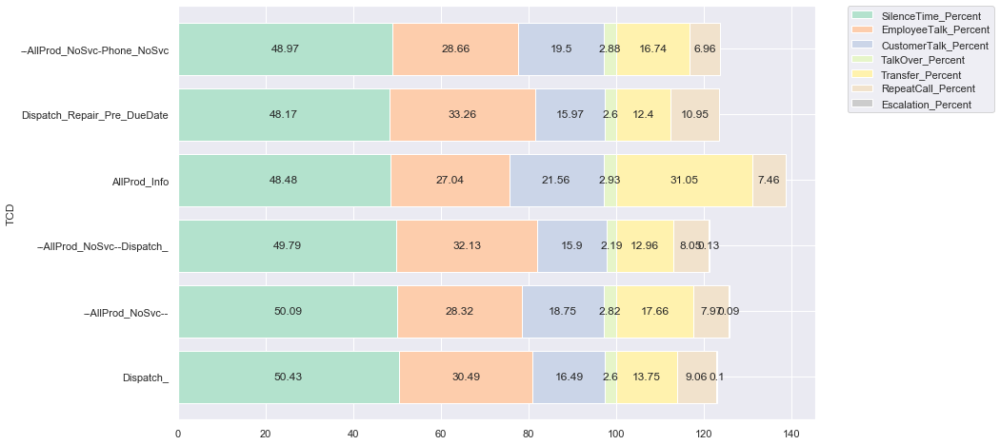

In [28]:
#draw plot
printmd('#### Top 6 TCD Vs. Few Metrics For Latest Month (Incoming Calls)')
plt.figure(figsize=(15,12));
clr =sns.color_palette("RdBu_r", 10);
sns.set();
df_chart = df_table2

ax = df_chart.plot(kind='barh', stacked=True, figsize=(12,8),width=0.8,cmap = 'Pastel2');
labels = []
for j in df_chart.columns:
    for i in df_chart.index:
        #label = str(j)+": " + str(df_chart.loc[i][j])
        label = str(df_chart.loc[i][j])
        labels.append(label)

patches = ax.patches;

for label, rect in zip(labels, patches):
    width = rect.get_width()
    if width > 0:
        x = rect.get_x()
        y = rect.get_y()
        height = rect.get_height()
        ax.text(x + width/2., y + height/2., label, ha='center', va='center');
#ax.legend(loc=4)

# #wrap long lables
# lables = tcd_list_6 #['a','b','c']
# lables = [ '\n'.join(wrap(l, 20)) for l in lables ]
# # #plt.setp(ax.set_yticklabels(lables))
# ax.set_yticklabels(lables);

# Put the legend out of the figure
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.);

# Handle (AHT) Time Statistics

## Month on Month Handle Time Splits In Minutes (Incoming Calls)

#### Month on Month Handle Time Components in Minutes (Incoming Calls)

<Figure size 1080x720 with 0 Axes>

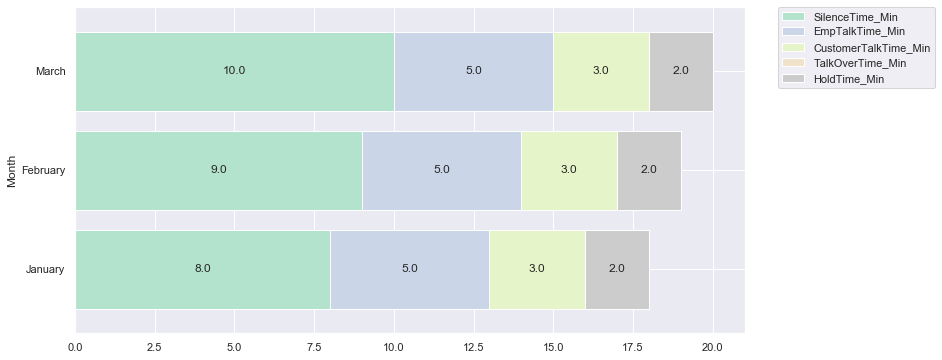

In [29]:
#create a copy with Month and handle time components
printmd('#### Month on Month Handle Time Components in Minutes (Incoming Calls)')
df_inc = sa_inc.copy()
df_inc_month = df_inc[['Month',
                    'SilenceTime_Min',
                    'EmpTalkTime_Min', 
                    'CustomerTalkTime_Min',
                    'TalkOverTime_Min',
                    'HoldTime_Min']]

#create a table by grouping with variable
table = df_inc_month.groupby('Month').mean()
table = round(table).sort_values(by=['SilenceTime_Min'],ascending = True)
table.reset_index()

#draw plot
plt.figure(figsize=(15,10));
clr =plt.get_cmap("Blues", 10)
sns.set();
df = table
ax = df.plot(kind='barh', stacked=True, figsize=(12, 6),width=0.8,colormap= 'Pastel2');
labels = []
for j in df.columns:
    for i in df.index:
        #label = str(j)+": " + str(df.loc[i][j])
        label = str(df.loc[i][j])
        labels.append(label)

patches = ax.patches;

for label, rect in zip(labels, patches):
    width = rect.get_width()
    if width > 0:
        x = rect.get_x()
        y = rect.get_y()
        height = rect.get_height()
        ax.text(x + width/2., y + height/2., label, ha='center', va='center')
#ax.legend(loc=4)

#wrap long lables
lables = month_list #['a','b','c']
lables = [ '\n'.join(wrap(l, 20)) for l in lables ]
#plt.setp(ax.set_yticklabels(lables))
ax.set_yticklabels(lables);

# Put the legend out of the figure
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.);
#df_inc.shape

## Month on Month Handle Time Components as Percentages (Incoming Calls)

#### Month on Month Handle Time Components in Percentages (Incoming Calls)

<Figure size 1080x720 with 0 Axes>

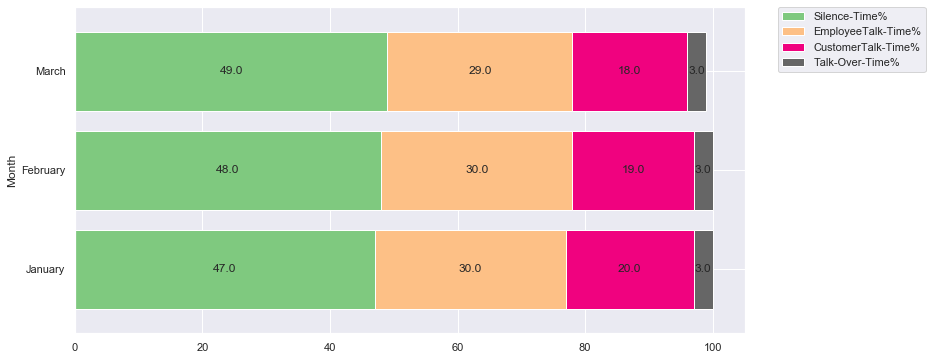

In [30]:
#create a copy with Month and handle time components in Percentages
printmd('#### Month on Month Handle Time Components in Percentages (Incoming Calls)')
#convert % columns as floats 
cols = ['Silence-Time%', 'EmployeeTalk-Time%','CustomerTalk-Time%','Talk-Over-Time%']

for i in range(len(cols)):
    df_inc[cols[i]] = df_inc[cols[i]].astype('str') 
    df_inc[cols[i]]= df_inc[cols[i]].str.replace(r'\%', '').astype(float)


df_inc_month_per = df_inc[['Month',
                    'Silence-Time%',
                    'EmployeeTalk-Time%', 
                    'CustomerTalk-Time%',
                    'Talk-Over-Time%'
                    ]]

#create a table by grouping with variable
table = df_inc_month_per.groupby('Month').mean()
table = round(table).sort_values(by=['Silence-Time%'],ascending = True)
table.reset_index()

#draw plot
plt.figure(figsize=(15,10));
clr =sns.color_palette("RdBu_r", 10);
sns.set();
df = table
ax = df.plot(kind='barh', stacked=True, figsize=(12, 6),width=0.8,colormap='Accent');
labels = []
for j in df.columns:
    for i in df.index:
        #label = str(j)+": " + str(df.loc[i][j])
        label = str(df.loc[i][j])
        labels.append(label)

patches = ax.patches;

for label, rect in zip(labels, patches):
    width = rect.get_width()
    if width > 0:
        x = rect.get_x()
        y = rect.get_y()
        height = rect.get_height()
        ax.text(x + width/2., y + height/2., label, ha='center', va='center');
#ax.legend(loc=4)

#wrap long lables
lables = month_list #['a','b','c']
lables = [ '\n'.join(wrap(l, 20)) for l in lables ]
#plt.setp(ax.set_yticklabels(lables))
ax.set_yticklabels(lables);

# Put the legend out of the figure
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.);
#df_inc.shape

## Ridge Plot to show Month on Month SilenceTime

In [31]:
#Altair Ridge Plot
# random_subset = sa_inc.sample(n=10000)
# source = random_subset[['LocalStartTime','AHT_Min','SilenceTime_Min']]


# step = 25
# overlap = 1

# alt.Chart(source, height=step).transform_timeunit(
#     Month='month(LocalStartTime)'
# ).transform_joinaggregate(
#     mean_temp='mean(SilenceTime_Min)', groupby=['Month']
# ).transform_bin(
#     ['bin_max', 'bin_min'], 'SilenceTime_Min'
# ).transform_aggregate(
#     value='count()', groupby=['Month', 'mean_temp', 'bin_min', 'bin_max']
# ).transform_impute(
#     impute='value', groupby=['Month', 'mean_temp'], key='bin_min', value=0
# ).mark_area(
#     interpolate='monotone',
#     fillOpacity=0.8,
#     stroke='lightgray',
#     strokeWidth=0.5
# ).encode(
#     alt.X('bin_min:Q', bin='binned', title='Silence Time in Minutes'),
#     alt.Y(
#         'value:Q',
#         scale=alt.Scale(range=[step, -step * overlap]),
#         axis=None
#     ),
#     alt.Fill(
#         'mean_temp:Q',
#         legend=None,
#         scale=alt.Scale(domain=[30, 5], scheme='redyellowblue')
#     )
# ).facet(
#     row=alt.Row(
#         'Month:T',
#         title=None,
#         header=alt.Header(labelAngle=0, labelAlign='right', format='%B')
#     )
# ).properties(
#     title='Silence Time',
#     bounds='flush'
# ).configure_facet(
#     spacing=0
# ).configure_view(
#     stroke=None
# ).configure_title(
#     anchor='end'
# )


## AHT By Month Change in Percentage & Minutes (Incoming Calls)

In [32]:
#%%time
#create table of AHT by month

df_inc_aht = df_inc[['Month','AHT_Min']]
df_inc_aht['Month'] = pd.Categorical(df_inc_aht['Month'], categories=month_list, ordered=True)
by_month_aht = df_inc_aht.groupby(['Month'])['AHT_Min'].agg(['mean'])
by_month_aht = by_month_aht.sort_values(by=['Month'],ascending=True).reset_index()

by_month_aht = round(by_month_aht,2)
by_month_aht= by_month_aht.rename(columns={'mean': 'AHT(Minutes)'})
by_month_aht

#Find the percent change
series = by_month_aht['AHT(Minutes)']
by_month_aht ['Change_Percent'] = round(series.pct_change()*100,2)
by_month_aht.apply(pd.to_numeric, errors='coerce', axis=1)
by_month_aht['Change_Percent']= by_month_aht['Change_Percent'].fillna(0)

#Find the Minutes Difference by Month

by_month_aht['Difference'] = by_month_aht['AHT(Minutes)'].diff(1)

printmd('#### AHT By Month Change in Percentage & Minutes (Incoming Calls)')

by_month_aht
# df_inc.shape

#### AHT By Month Change in Percentage & Minutes (Incoming Calls)

,Month,AHT(Minutes),Change_Percent,Difference
0,January,16.46,0.00,NaN
1,February,16.38,-0.49,-0.08
2,March,17.87,9.10,1.49


## Month on Month Handle Time Changes

In [33]:
#AHT trend Month on Month
data = by_month_aht
data_x = by_month_aht['Month']
data_y = by_month_aht['AHT(Minutes)']

fig = go.Figure(data=go.Scatter(x=data_x, y=data_y))
#printmd('##### Move your cursor over the line markers to view the values')
fig.update_layout(title = 'AHT Trend Month on Month (For values, Move your cursor over the line marker)')

fig.show()

del by_month_aht
gc.collect()

498

In [34]:
#%%time
#create table of AHT by month

df_inc_metrics = df_inc[['Month','AHT_Min','Silence-Time%','CustomerTalk-Time%','EmployeeTalk-Time%','Talk-Over-Time%']]
df_inc_metrics['Month'] = pd.Categorical(df_inc_metrics['Month'], categories=month_list, ordered=True)
by_month_metrics = df_inc_metrics.groupby(['Month'])['AHT_Min','Silence-Time%','CustomerTalk-Time%',
                                                     'EmployeeTalk-Time%','Talk-Over-Time%'].agg(['mean'])

by_month_metrics = by_month_metrics.sort_values(by=['Month'],ascending=True).reset_index()
by_month_metrics.columns = by_month_metrics.columns.droplevel(1)
by_month_metrics = round(by_month_metrics,2)
# by_month_metrics= by_month_metrics.rename(columns={'mean': 'AHT_Minutes'})
by_month_metrics


#Find the Minutes Difference by Month

by_month_metrics['AHT_Change'] = by_month_metrics['AHT_Min'].diff(1).fillna('')
by_month_metrics['Silence-Time_Change'] = by_month_metrics['Silence-Time%'].diff(1).fillna('')
by_month_metrics['CustomerTalk-Time_Change'] = by_month_metrics['EmployeeTalk-Time%'].diff(1).fillna('')
by_month_metrics['EmployeeTalk-Time_Change'] = by_month_metrics['EmployeeTalk-Time%'].diff(1).fillna('')
by_month_metrics['Talk-Over-Time_Change'] = by_month_metrics['Talk-Over-Time%'].diff(1).fillna('')

by_month_metrics = by_month_metrics.round(2)
# by_month_metrics

In [35]:
# #AHT change Month on Month
# printmd('#### Handle Time Components Month on Month Change (Incoming Calls)')
data = by_month_metrics
data_x = by_month_metrics['Month']
data_y = by_month_metrics['AHT_Change']
data_y1 = by_month_metrics['Silence-Time_Change']
data_y2 = by_month_metrics['CustomerTalk-Time_Change']
data_y3 = by_month_metrics['EmployeeTalk-Time_Change']
data_y4 = by_month_metrics['Talk-Over-Time_Change']
fig = go.Figure()

fig.add_trace(go.Bar(x=data_x, y=data_y,name='AHT Minutes',text= data_y ))
fig.add_trace(go.Bar(x=data_x, y=data_y1,name='SilenceTime %',text=data_y1))
fig.add_trace(go.Bar(x=data_x, y=data_y2,name='Customer Talk Time %',text=data_y2))
fig.add_trace(go.Bar(x=data_x, y=data_y3,name='Employee Talk Time %',text=data_y3))
fig.add_trace(go.Bar(x=data_x, y=data_y4,name='Talk-Over Time %',text=data_y4))

fig.update_layout(#barmode='relative', 
                  title_text='Handle Time Metrics vs. Previous Month')
fig.update_traces(textposition='outside')
printmd('#### For values, Move your cursor over the line marker. Changes are in percentage points except for AHT, which is in Minutes')

fig.show()

del by_month_metrics
# #df_inc.shape
gc.collect()

#### For values, Move your cursor over the line marker. Changes are in percentage points except for AHT, which is in Minutes

17422

## Last Month Handle Time Component Spread

In [36]:
#Altair density plot of Handle Time Components
temp_source = is_latest_month().sample(n=5000)

source = temp_source[['SilenceTime_Min','CustomerTalkTime_Min','EmpTalkTime_Min','TalkOverTime_Min']]
del temp_source

source = is_latest_month().sample(n=5000)
printmd('#### Density plot on sampled data for the last month')
alt.Chart(source).transform_fold(
    ['SilenceTime_Min',
     'CustomerTalkTime_Min',
     'EmpTalkTime_Min',
     'TalkOverTime_Min'],
    as_ = ['Measurement_type', 'value']
).transform_density(
    density='value',
    bandwidth=0.3,
    groupby=['Measurement_type'],
    extent= [0, 8],
    counts = True,
    steps=200
).mark_area().encode(
    alt.X('value:Q'),
    alt.Y('density:Q', stack='zero'),
    alt.Color('Measurement_type:N')
).properties(width=600, height=300)



#### Density plot on sampled data for the last month

alt.Chart(...)

In [37]:
del source
gc.collect()

168

# Finding Relationship of AHT Components with AHT

## Find Correlations among AHT components

In [38]:
ALL = 'ALL'
def unique_sorted_values_plus_ALL(array):
    unique = array.unique().tolist()
    #unique.sort()
    unique.insert(0, 'ALL')
    return unique


In [39]:
# Sample Widget
# dropdown_month = widgets.Dropdown(options = unique_sorted_values_plus_ALL(df_inc.Month))

# output_month = widgets.Output()

# def dropdown_month_eventhandler(change):
#     output_month.clear_output()
#     with output_month:
#         if (change.new == ALL):
#             display(df_inc)
#         else:
#             display(df_inc[df_inc.Month == change.new])

# dropdown_month.observe(dropdown_month_eventhandler, names='value')

# display(dropdown_month)
# display(output_month)

In [40]:
# #Correlation Map
# dropdown_month = widgets.Dropdown(options = unique_sorted_values_plus_ALL(df_inc.Month))
# # dropdown_month = widgets.Dropdown(options = month_list)
# output_month_correlation = widgets.Output()

# def dropdown_month_eventhandler(change):
#     output_month_correlation.clear_output()
    
#     with output_month_correlation:
#         if (change.new == ALL):
#             df_temp = df_inc
#             #Find Correlations
#             cols=df_temp[['AHT_Min','EmpTalkTime_Min','HoldTime_Min', \
#                         'SilenceTime_Min','CustomerTalkTime_Min']]
#             corr = cols.corr()   
            
#             display(
                
#                 sns.heatmap(corr, annot=True))
            
#         else:
#             df_temp = df_inc[df_inc.Month == change.new]
#             #Find Correlations
#             cols=df_temp[['AHT_Min','EmpTalkTime_Min','HoldTime_Min', \
#                         'SilenceTime_Min','CustomerTalkTime_Min']]
#             corr = cols.corr()
            
#             display(
                
#                 px.imshow(corr,
#                           x=['AHT_Min','EmpTalkTime_Min','HoldTime_Min', \
#                         'SilenceTime_Min','CustomerTalkTime_Min'],
#                             y=['AHT_Min','EmpTalkTime_Min','HoldTime_Min', \
#                         'SilenceTime_Min','CustomerTalkTime_Min'],
#                          )
                
                
#             )
            
            
# dropdown_month.observe(dropdown_month_eventhandler, names='value')

# display(dropdown_month)
# display(output_month_correlation)
# del output_month_correlation

## Correlation Plot

#### Correlations Among Handle Time Components (Incoming Calls)

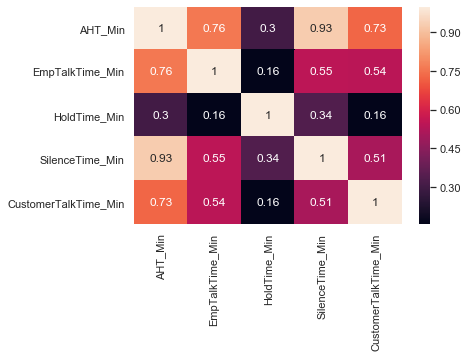

In [41]:
#Find Correlations

cols=df_inc[['AHT_Min','EmpTalkTime_Min','HoldTime_Min', \
            'SilenceTime_Min','CustomerTalkTime_Min']]
corr = cols.corr()
corr
#Correlation Plot
printmd('#### Correlations Among Handle Time Components (Incoming Calls)')

sns.heatmap(corr, annot=True)
plt.show()
del cols

## Regression and spread of AHT vs. Silence Time (Incoming Calls)

In [42]:
# #AHT vs. Silence Time Regression
# clr =sns.color_palette("RdBu_r", 8)
# printmd('#### AHT vs. Silence Time Regression - Spread of Data')
# sns.set(style="darkgrid")
# g = sns.jointplot('AHT_Min', 'SilenceTime_Min', data=df_inc,
#                   kind="reg", truncate=False,
#                   xlim=(0, 60), ylim=(0, 12),
#                   color="m", height=7)

## Month View of AHT vs. Silence Time

In [43]:
#Aht vs. Silence Time by Month
temp_source = sa_inc.sample(n=10000)

source = temp_source[['AHT_Min','SilenceTime_Min','Month']]

del temp_source

printmd('#### AHT vs. Silence Time Sample to see the spread month over month')

base = alt.Chart(source)

xscale = alt.Scale(domain=(0.0, 100.0))
yscale = alt.Scale(domain=(0.0, 75.0))

area_args = {'opacity': .3, 'interpolate': 'step'}

points = base.mark_circle().encode(
    alt.X('AHT_Min', scale=xscale),
    alt.Y('SilenceTime_Min', scale=yscale),
    color='Month',
)

top_hist = base.mark_area(**area_args).encode(
    alt.X('AHT_Min:Q',
          # when using bins, the axis scale is set through
          # the bin extent, so we do not specify the scale here
          # (which would be ignored anyway)
          bin=alt.Bin(maxbins=20, extent=xscale.domain),
          stack=None,
          title=''
         ),
    alt.Y('count()', stack=None, title=''),
    alt.Color('Month:N'),
).properties(height=60)

right_hist = base.mark_area(**area_args).encode(
    alt.Y('SilenceTime_Min:Q',
          bin=alt.Bin(maxbins=20, extent=yscale.domain),
          stack=None,
          title='',
         ),
    alt.X('count()', stack=None, title=''),
    alt.Color('Month:N'),
).properties(width=60)

top_hist & (points | right_hist)

#### AHT vs. Silence Time Sample to see the spread month over month

alt.VConcatChart(...)

In [44]:
del source
del base
gc.collect()

5235

## Aribitrary Reduction in Silence Time & Potential Additional Calls

In [45]:
#create regression model
import statsmodels.api as sm

# X = df_inc['SilenceTime_Min']
# Y = df_inc['AHT_Min']
# X = sm.add_constant(X) # adding a constant

# model = sm.OLS(Y, X).fit()
# predictions = model.predict(X) 

# print_model = model.summary()
# print(print_model)

# new_aht = 4.2594 + (1.4250)*2
# round(new_aht,2)

printmd('#### **~87% of variation in AHT can be explained by Silence Time**''\n')
printmd('#### For Every 1 Minute of Silence Time Increase, AHT will go up by 1.43 Minutes,''\n')

printmd('##### Move the slider to understand how much the AHT will be corresponding to increase in Silence Time in Minutes,''\n')

# slider3 = v.Slider(thumb_label='always', v_model=25)
# widgets.jslink((slider, 'v_model'), (slider3, 'v_model'))

@interact(SilenceTime_in_Minutes=(1,10))
def new_aht(SilenceTime_in_Minutes):
    nht = 4.2594 + (1.4250)*SilenceTime_in_Minutes
    return round(nht,2)
    


#### **~87% of variation in AHT can be explained by Silence Time**


#### For Every 1 Minute of Silence Time Increase, AHT will go up by 1.43 Minutes,


##### Move the slider to understand how much the AHT will be corresponding to increase in Silence Time in Minutes,


interactive(children=(IntSlider(value=5, description='SilenceTime_in_Minutes', max=10, min=1), Output()), _dom…

# Silence Time Reduction Impact (Incoming Calls)

## Silence Time Statistics(Incoming Calls)

#### BoxPlot of the Silence Time(Incoming Calls)


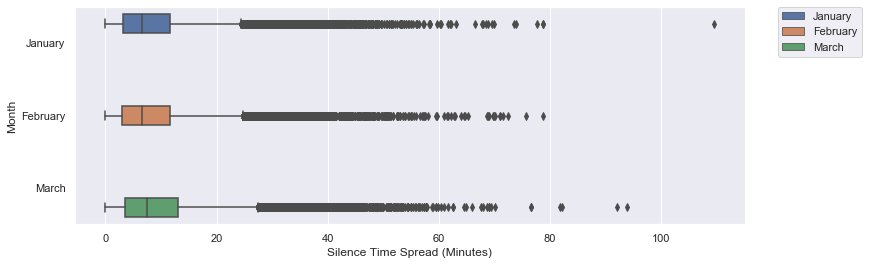

In [46]:
#BoxPlot of the Silence Time(Incoming Calls)
printmd('#### BoxPlot of the Silence Time(Incoming Calls)''\n')
#Boxplot
plt.figure(figsize=(12, 4))
#clr =sns.color_palette("Pastel1", 8)

ax = sns.boxplot(x='SilenceTime_Min',
            order=month_list,
            y="Month",
            hue="Month",
            #color='g',
            #palette= clr,
            orient = 'h',
            data=df_inc)
#Boxplot with wide-form data
#sns.boxplot(data=iris,orient="h") 

s=ax.set(xlabel="Silence Time Spread (Minutes)")
# Put the legend out of the figure
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.);
del ax

## Potential Capacity Creation

In [47]:
##printmd('#### Silence Time Statistics (Incoming Calls)')
anomalies = []

# Function to Detection Outlier on one-dimentional datasets.
def find_anomalies(random_data):
    # Set upper and lower limit to 3 standard deviation
    random_data_mean = np.mean(random_data)
    print("Average Silence Time (Min):", round(random_data_mean,1),'Minutes','\n')
    
    per_25 = np.percentile(random_data,25)
    print("25th Percentile of Silence Time (Min):", round(per_25,1),'Minutes','\n')    
    
    random_data_median = np.median(random_data)
    print("Median Value of Silence Time (Min):", round(random_data_median,1),'Minutes','\n')
    
    per_75 = np.percentile(random_data,75)
    print("75th Percentile of Silence Time (Min):", round(per_75,1),'Minutes','\n')
    per_90 = np.percentile(random_data,90)
    print("90th Percentile of Silence Time (Min):", round(per_90,1),'Minutes','\n')

    random_data_std = np.std(random_data)
    anomaly_cut_off = random_data_std * 3
    
    lower_limit  = random_data_mean - anomaly_cut_off 
    upper_limit = random_data_mean + anomaly_cut_off
    #print(lower_limit)
    print("Upper Threshold for Outlier(3 Standard Deviation from Mean) :", round(upper_limit,1),'Minutes','\n')
    # Generate outliers
    for outlier in random_data:
        if outlier > upper_limit or outlier < lower_limit:
            anomalies.append(outlier)
    return anomalies

#Capacity Creation
printmd('#### Potential Capacity that Can be Created (Incoming Calls)''\n')

def add_calls(outlier_list):
    
    ct = len(outlier_list)
    print('No: of calls above upper threshold (3 Standard deviation from Average):', ct,'\n')
    #mean of silence time which are above outlier threshold
    ct_mean = round(np.mean(outlier_list),2)
  
    print('Average Silence Time of the group above threshold:', ct_mean,'Minutes','\n')
    
    #max value in outlier_list
    ct_max = round(np.max(outlier_list),2)
    #mean of silence time in TCD dataset
    dat_mean = round(np.mean(df_inc['SilenceTime_Min']),2)
    #Find outlier threshold
    upper_limit = round(dat_mean+(np.std(df_inc['SilenceTime_Min'])*3),2)
    #difference between outlier threshold and mean
    mean_diff = round(ct_mean-upper_limit,2)
  
    additional_calls = ((ct*mean_diff)/upper_limit)
    print('Additional Calls that can be handled if SilenceTime is reduced by',
          mean_diff,"Minutes:",round(additional_calls),'\n')
    print("Why",mean_diff,'Minutes?: ',
          mean_diff, "Minutes is the difference of outlier threshold and median value of the data above threshold")
    #return ct, mean_diff, additional_calls

dropdown_month = widgets.Dropdown(options = unique_sorted_values_plus_ALL(df_inc.Month))

output_month_capacity = widgets.Output()    

def dropdown_month_eventhandler(change):
    output_month_capacity.clear_output()
    with output_month_capacity:
        if (change.new == ALL):
            dftemp = df_inc
            #data
            data= dftemp['SilenceTime_Min']
            outlier_list = find_anomalies(data)
            add_calls(outlier_list)
        else:
            dftemp = df_inc[df_inc.Month == change.new]
            #data
            data= dftemp['SilenceTime_Min']
            outlier_list = find_anomalies(data)
            add_calls(outlier_list)
    
dropdown_month.observe(dropdown_month_eventhandler, names='value')

display(dropdown_month)
display(output_month_capacity)

#### Potential Capacity that Can be Created (Incoming Calls)


Dropdown(options=('ALL', 'January', 'February', 'March'), value='ALL')

Output()

# Identify Consultants with High Silence Time (Incoming Calls)

### Shortlist consultants who are handling at least 80% of overall call handling & has an average Silence Time above the threshold (3 standard deviation from mean) 

In [48]:
#Consultant shortliting
def find_emp(call_type, df, col, vol_contribution):
    
    random_data = df[col]
    
    # Set upper and lower limit to 3 standard deviation
    random_data_mean = np.mean(random_data)
    random_data_median = np.median(random_data)
    

    random_data_std = np.std(random_data)
    anomaly_cut_off = random_data_std * 3

    lower_limit  = random_data_mean - anomaly_cut_off 
    upper_limit = random_data_mean + anomaly_cut_off
    
    print("Outlier Threshold for Silence Time for",call_type, round(upper_limit,1),'Minutes',
          '(3 Standard Deviation from Mean)','\n')
    
    is_gr_ul =  random_data > upper_limit
    df_w_data_gr_ul = df[is_gr_ul].reset_index()
    outlier_list = df_w_data_gr_ul[col]

    temp = df_w_data_gr_ul.groupby(['Employee'])[col].agg(['count'])
    temp = temp.reset_index().sort_values(by=['count'],ascending=False)
    
    data = temp['Employee']
    

    top_n = rp.summary_cat(data).round(2)
    top_n

    #create cumulative sum and cumulative percent columns
    top_n['cumulative_sum'] = top_n.Count.cumsum()
    top_n['cumulative_perc'] = round(100*top_n.cumulative_sum/top_n.Count.sum())
    top_n

    #subset only TCD & Cumulative percent column
    top_80 = top_n[['Outcome','cumulative_perc']]
    top_80

    #Find TCDs which makes up for 80% of the volume
    is_80 =  top_80['cumulative_perc']>=vol_contribution

    #Filter the only the TCD which makes up for 80% of volume
    top_80_variable = top_80[is_80]
    
    #convert the top employee names to list
    emp_list =  top_80_variable.Outcome.tolist()
        
    outlier_mean = round(np.mean(outlier_list),2)
    data_mean =  round(np.mean(df[col]),2)
    mean_diff = round(outlier_mean - data_mean,2)
    
    count_emp = len(emp_list)
    
    print('Average Silence Time For Consultants above outlier threshold of overall Silence Time:',
          outlier_mean,'Minutes','\n')
          
    print(mean_diff, 'Minutes Higher Than overall Silence Time Average for',call_type,'\n')
    
    print('Top 80% of Consultant Count Who Contribute to Calls above Outlier Threshold:', count_emp,'\n')
    
    print('Top 80% Consultants Contributing to Calls above Outlier Threshold:\n',(*emp_list), sep = "\n")
    

printmd('#### Identify Consultants with High Silence Time (Incoming Calls)')
printmd('#### Select the month to view the result:')

#Call the find_emp function
call_type = 'Incoming Calls'
col = 'SilenceTime_Min'
vol_contribution = 82

dropdown_month = widgets.Dropdown(options = unique_sorted_values_plus_ALL(df_inc.Month))

output_month_consultant = widgets.Output()

def dropdown_month_eventhandler(change):
    output_month_consultant.clear_output()
    with output_month_consultant:
        if (change.new == ALL):
            dftemp = df_inc
            #data
            df= dftemp
            find_emp(call_type, df, col, vol_contribution)

        else:
            dftemp = df_inc[df_inc.Month == change.new]
            #data
            df= dftemp
            find_emp(call_type, df, col, vol_contribution)

dropdown_month.observe(dropdown_month_eventhandler, names='value')

display(dropdown_month)
display(output_month_consultant)

#df_inc.shape

#### Identify Consultants with High Silence Time (Incoming Calls)

#### Select the month to view the result:

Dropdown(options=('ALL', 'January', 'February', 'March'), value='ALL')

Output()

# Consultant Skill Matrix vs. TCD (Incoming Calls)

## Find Threshold for AHT and Silence Time

In [49]:
#Find threshold for AHT & ST

def find_aht_th():
    random_data = df_inc['AHT_Min']
    random_data_mean = np.mean(random_data)
    random_data_std = np.std(random_data)
    anomaly_cut_off = random_data_std * 3
    lower_limit  = random_data_mean - anomaly_cut_off 
    upper_limit = random_data_mean + anomaly_cut_off
    return upper_limit

def find_st_th():
    random_data = df_inc['SilenceTime_Min']
    random_data_mean = np.mean(random_data)
    random_data_std = np.std(random_data)
    anomaly_cut_off = random_data_std * 3
    lower_limit  = random_data_mean - anomaly_cut_off 
    upper_limit = random_data_mean + anomaly_cut_off
    return upper_limit

aht_th = find_aht_th()
st_th = find_st_th()

## Create Score Column for Each Call
### Scores are calculated as: (CSATx20+AHTx10+SilenceTimex20+Resolutionx10-DSATx10-Transferx5)

In [50]:
#Create CSAT & DSAT score column
sat_cols = ['ICM-CSAT','ICM-DSAT','ICM-Transfer','ICM-ResolutionScript']
new_sat_cols = ['CSAT_Score','DSAT_Score','Transfer_Score','Resolution_Score']


df_inc[sat_cols] = df_inc[sat_cols].apply(pd.to_numeric, errors='coerce', axis=1)

for i in range(len(new_sat_cols)):
    df_inc[new_sat_cols[i]]= np.where(df_inc[sat_cols[i]]>=th, 1, 0)

#create AHT score column
df_inc['AHT_Score'] = np.where(df_inc['AHT_Min']<=aht_th, 1, 0)   

#create AHT score column
df_inc['SilenceTime_Score'] = np.where(df_inc['SilenceTime_Min']<=st_th, 1, 0)   

#create a score column (CSAT-DSAT+AHT)

# df_inc = df_inc.copy()
df_inc['AgentRating'] = (df_inc['CSAT_Score']*20+df_inc['AHT_Score']*10+df_inc['SilenceTime_Score']*20+df_inc['Resolution_Score']*10 -
                     df_inc['DSAT_Score']*10-df_inc['Transfer_Score']*5)
df_inc[['AgentRating', 'CSAT_Score','AHT_Score','SilenceTime_Score',
    'DSAT_Score','Transfer_Score','Resolutions_Score']] = df_inc[['AgentRating', 'CSAT_Score','AHT_Score','SilenceTime_Score',
                                          'DSAT_Score','Transfer_Score','Resolution_Score']].apply(pd.to_numeric) 

## Finding TCD Combinations (Incoming Calls)

In [51]:
# drop the rows with no values in TCD column 
temp = df_inc.copy()
indexNames = temp[(temp['TCD'] == '')].index
temp.drop(indexNames , inplace=True)

df_temp_inc = temp[['TCD','Month']]
del temp

printmd('**Total TCD Combinations:**')
printmd('#### Select the month to view the TCDs contribution:')
#print(len(df_inc.TCD.value_counts()))


dropdown_month = widgets.Dropdown(options = unique_sorted_values_plus_ALL(df_inc.Month))

output_month_tcd = widgets.Output()

def dropdown_month_eventhandler(change):
    output_month_tcd.clear_output()
    with output_month_tcd:
        if (change.new == ALL):
            dftemp = df_temp_inc
            #data
            t = rp.summary_cat(dftemp['TCD'])
            t = t.drop(['Variable'], axis = 1)
            t = t.rename(columns={'Outcome':'TCD'})
            display(len(t.TCD.value_counts()))
            display(t)            
            
        else:
            dftemp = df_temp_inc[df_temp_inc.Month == change.new]
            #data
            t = rp.summary_cat(dftemp['TCD'])
            t = t.drop(['Variable'], axis = 1)
            t = t.rename(columns={'Outcome':'TCD'})
            display(len(t.TCD.value_counts()))
            display(t)
            

dropdown_month.observe(dropdown_month_eventhandler, names='value')

display(dropdown_month)
display(output_month_tcd)

**Total TCD Combinations:**

#### Select the month to view the TCDs contribution:

Dropdown(options=('ALL', 'January', 'February', 'March'), value='ALL')

Output()

In [52]:
# # drop the rows with no values in TCD column 
# df_temp_inc = df_inc.copy()
# indexNames = df_temp_inc[(df_temp_inc['TCD'] == '')].index
# df_temp_inc.drop(indexNames , inplace=True)
# df_temp_inc.shape

## Creating Level 1 TCD Categories for easier Categorization

In [53]:
#Create L1 TCD Categories
printmd('#### Creating Level 1 TCD Categories for easier Categorization''\n')

dfsub = df_inc[['TCD','Month','Employee','AgentRating']]

dfsub['TCD_1'] = ''

temp=dfsub.TCD.fillna('0')

dfsub['TCD_1'] =  pd.np.where(temp.str.contains("Dispatch"),"Dispatch",
                  pd.np.where(temp.str.contains("AllProd"),"All Product Issues",
                  pd.np.where(temp.str.contains("Ghost"),"Ghost Call",
                  pd.np.where(temp.str.contains("Internet"),"Internet", 
                  pd.np.where(temp.str.contains("Phone"),"Phone",
                  pd.np.where(temp.str.contains("Email"),"Email",
                  pd.np.where(temp.str.contains("Misdirect"), "Misdirect",
                  pd.np.where(temp.str.contains("Suspend"), "Suspend",
                  pd.np.where(temp.str.contains("TV"),'TV',
                  pd.np.where(temp.str.contains("Repair"),"Repair",
                  pd.np.where(temp.str.contains("0"),'No TCD Tagging',"WMT")))))))))))
dfsub.TCD_1.value_counts()

# rp.summary_cat(dfsub['TCD_1'])

printmd('##### Select the month from dropdown to view Level1 TCD Category contribution split,''\n')
dropdown_month = widgets.Dropdown(options = unique_sorted_values_plus_ALL(df_inc.Month))

output_month_tcd_1 = widgets.Output()

def dropdown_month_eventhandler(change):
    output_month_tcd_1.clear_output()
    with output_month_tcd_1:
        if (change.new == ALL):
            dftemp = dfsub
            #data
            z = rp.summary_cat(dftemp['TCD_1'])
            z = z.drop(['Variable'], axis = 1)
            z = z.rename(columns={'Outcome':'TCD_Level1'})
            z = z.drop([0])
            display(z)
            
        else:
            dftemp = dfsub[dfsub.Month == change.new]
            #data
            z = rp.summary_cat(dftemp['TCD_1'])
            z = z.drop(['Variable'], axis = 1)
            z = z.rename(columns={'Outcome':'TCD_Level1'})
            z = z.drop([0])
            display(z)
            

dropdown_month.observe(dropdown_month_eventhandler, names='value')

display(dropdown_month)
display(output_month_tcd_1)

#### Creating Level 1 TCD Categories for easier Categorization


##### Select the month from dropdown to view Level1 TCD Category contribution split,


Dropdown(options=('ALL', 'January', 'February', 'March'), value='ALL')

Output()

# People Analytics

 ## Finding Consultant Rating by TCD (Incoming Calls)

###  Creating some Base Rules (Minimum Transactions, Smoothening Agent Rating distribution to avoid negative values)

In [54]:
users_interactions_count_df = dfsub.groupby(['Employee', 'TCD','TCD_1']).size().groupby('Employee').size()
print('# Consultants: %d' % len(users_interactions_count_df))
users_with_enough_interactions_df = users_interactions_count_df[users_interactions_count_df >= 10].reset_index()[['Employee']]
print('# Consultants with at least 10 interactions (Calls by TCD) on the entire dataset: %d' % len(users_with_enough_interactions_df))

printmd('##### Select the month from dropdown to view number of agents with minimum of 10 interactios for selected month,''\n')
dropdown_month = widgets.Dropdown(options = unique_sorted_values_plus_ALL(df_inc.Month))

output_month_cons_inter = widgets.Output()

def dropdown_month_eventhandler(change):
    output_month_cons_inter.clear_output()
    with output_month_cons_inter:
        if (change.new == ALL):
            dftemp = dfsub
            #data
            u = dftemp.groupby(['Employee', 'TCD','TCD_1']).size().groupby('Employee').size()
            u = u[u >= 10].reset_index()[['Employee']]
            display(len(u))
            
        else:
            dftemp = dfsub[dfsub.Month == change.new]
            #data
            u = dftemp.groupby(['Employee', 'TCD','TCD_1']).size().groupby('Employee').size()
            u = u[u >= 10].reset_index()[['Employee']]
            display(len(u))

dropdown_month.observe(dropdown_month_eventhandler, names='value')

display(dropdown_month)
display(output_month_cons_inter)

# Consultants: 290
# Consultants with at least 10 interactions (Calls by TCD) on the entire dataset: 266


##### Select the month from dropdown to view number of agents with minimum of 10 interactios for selected month,


Dropdown(options=('ALL', 'January', 'February', 'March'), value='ALL')

Output()

In [55]:
printmd('#### **Number of Agents vs. Minimum Number of Interaction**''\n')
printmd('##### Move the slider to understand how many agents have had minimum how many interactions,''\n')

@interact(Interaction=(1,200))
def min_interaction(Interaction):
    users_with_enough_interactions_df = users_interactions_count_df[users_interactions_count_df >= Interaction].reset_index()[['Employee']]
    return len(users_with_enough_interactions_df)

#### **Number of Agents vs. Minimum Number of Interaction**


##### Move the slider to understand how many agents have had minimum how many interactions,


interactive(children=(IntSlider(value=100, description='Interaction', max=200, min=1), Output()), _dom_classes…

### Filter Tasks of agents with Minimum Transaction of Ten Transaction

In [56]:
print('# of interactions: %d' % len(dfsub))
interactions_from_selected_users_df = dfsub.merge(users_with_enough_interactions_df, 
               how = 'right',
               left_on = 'Employee',
               right_on = 'Employee')
print('# of interactions from users with at least 10 interactions: %d' % len(interactions_from_selected_users_df))


# of interactions: 143178
# of interactions from users with at least 10 interactions: 142834


### Identifying Number of unique Consultants/TCD Interactions

####  Aggregating all the interactions the user has performed in an task by a weighted sum of Agent Rating and applying a log transformation to smooth the distribution.

In [57]:
def smooth_user_preference(x):
    return np.log(x+10).round().astype(np.int8)
    
interactions_full_df = interactions_from_selected_users_df \
                    .groupby(['Employee', 'TCD','TCD_1'])['AgentRating'].sum() \
                    .apply(smooth_user_preference).reset_index()
print('# of unique Constultants/TCD interactions: %d' % len(interactions_full_df))

# of unique Constultants/TCD interactions: 16119


###  Consultants Rated against TCD (sample view)- (Incoming Calls)  

In [58]:
#Filter only Unique Rows & Treat NAs if any in Agent Rating

printmd('#### Consultants Rated against TCD (sample view)- (Incoming Calls)''\n')

#count duplicate rows
interactions_full_df.groupby(interactions_full_df.columns.tolist(),as_index=False).size()
#count the NA in data
interactions_full_df.isna().sum()
#if there are NA rows treat them
interactions_full_df.fillna(0)
interactions_full_df['AgentRating'].fillna(0, inplace=True)
df_temp = interactions_full_df

df_temp = df_temp.sort_values(['TCD','AgentRating'], ascending = (False, False))
df_temp = df_temp.copy()

df_temp['Emp_TCD'] = df_temp['Employee'].astype(str)+df_temp['TCD'].astype(str)+df_temp['TCD_1'].astype(str)
df_temp = df_temp[['Employee','TCD','TCD_1','AgentRating','Emp_TCD']].reset_index()
#df_temp[df_temp['Employee']=='Fernandes, Sebby']
df_temp.head(5)

#### Consultants Rated against TCD (sample view)- (Incoming Calls)


,index,Employee,TCD,TCD_1,AgentRating,Emp_TCD
0,2026,"Chavan, Surabhi",Repair_Pre_DueDate,Repair,6,"Chavan, SurabhiRepair_Pre_DueDateRepair"
1,3005,"Fernandes, Sebby",Repair_Pre_DueDate,Repair,6,"Fernandes, SebbyRepair_Pre_DueDateRepair"
2,3165,"Gaikwad, Aakansha Milind",Repair_Pre_DueDate,Repair,6,"Gaikwad, Aakansha MilindRepair_Pre_DueDateRepair"
3,4035,"Hari, Nandwani",Repair_Pre_DueDate,Repair,6,"Hari, NandwaniRepair_Pre_DueDateRepair"
4,5008,"Kamble, Amit",Repair_Pre_DueDate,Repair,6,"Kamble, AmitRepair_Pre_DueDateRepair"


### Consultant Ratings Statistics

In [59]:
printmd('#### Agent Rating Details''\n')
df_temp.describe().round()

#### Agent Rating Details


,index,AgentRating
count,16119.0,16119.0
mean,8059.0,5.0
std,4653.0,1.0
min,0.0,0.0
25%,4030.0,4.0
50%,8059.0,4.0
75%,12088.0,5.0
max,16118.0,9.0


### Visual Representation of Agent Performance against TCDs (Guide to understand training/development areas for Consultants)

#### Visual Representation of Agent Performance against TCDs (Guide to understand training/development areas for Consultants)


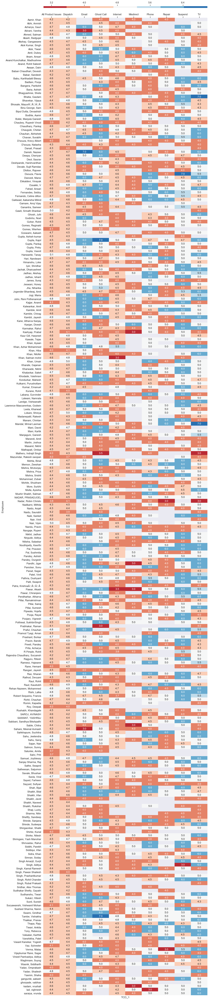

In [60]:
#%%time

printmd('#### Visual Representation of Agent Performance against TCDs (Guide to understand training/development areas for Consultants)''\n')

#creating heatmap
df_new = df_temp[['Employee','TCD_1','AgentRating']]

df1 = df_new.copy()

df2 =  df1.pivot_table(index='Employee',
                      columns='TCD_1',
                      values= 'AgentRating')
                     #fill_value = False)

plt.figure(figsize=(13, 80))
# clr = sns.diverging_palette(240, 10, n=9)
clr = sns.color_palette("RdBu", 7)

# # Define two rows for subplots
# fig, (cax, ax) = plt.subplots(nrows=2, figsize=(10,80.025),  gridspec_kw={"height_ratios":[0.005, 1]})

ax = sns.heatmap(df2, annot=True, fmt='.1f',cmap=clr, cbar=False);
#set x axis label on top
ax.xaxis.set_ticks_position('top')
# split axes of heatmap to put colorbar
ax_divider = make_axes_locatable(ax)
# define size and padding of axes for colorbar
cax = ax_divider.append_axes('top', size = '0.2%', pad = '1%')
# make colorbar for heatmap. 
# Heatmap returns an axes obj but you need to get a mappable obj (get_children)
colorbar(ax.get_children()[0], cax = cax, orientation = 'horizontal')
# locate colorbar ticks
cax.xaxis.set_ticks_position('top')

## Potential Benefit by High Rated Agents

### Splitting Consultants as High-Rated (>8.01) and Low-Rated 
#### Split Point Decided by Two Sample T Test

In [61]:
df_temp.head(2)

,index,Employee,TCD,TCD_1,AgentRating,Emp_TCD
0,2026,"Chavan, Surabhi",Repair_Pre_DueDate,Repair,6,"Chavan, SurabhiRepair_Pre_DueDateRepair"
1,3005,"Fernandes, Sebby",Repair_Pre_DueDate,Repair,6,"Fernandes, SebbyRepair_Pre_DueDateRepair"


In [63]:
#find aht by tcd where agent rating is above limit 
printmd('#### Potential Benefit of Leveraging High-Rated Agents''\n')

is_gr_2 =  df_temp['AgentRating']>=8.01
filtered_emp = df_temp[is_gr_2].reset_index()
emp_3_list = filtered_emp.Employee.tolist()
emp_3_df = df_inc[df_inc.Employee.isin(emp_3_list)]


# df_inc = df_inc.copy()
# df_inc['Emp_TCD'] = df_inc['Employee'].astype(str)+ df_inc['TCD'].astype(str)

print('# of calls by high rated consultants: %d' % len(emp_3_df),'\n')

rating_aht = emp_3_df.groupby(['Emp_TCD']) ['SilenceTime_Min'].agg('mean').round(2)
rating_aht = rating_aht.to_frame().reset_index()
highrated_agent_mean = rating_aht['SilenceTime_Min'].mean()

#print('Average Silence Time for High Rated Consultants: %d' % highrated_agent_mean,'Minutes','\n')

is_ls_2 =  df_temp['AgentRating']< 8.01
filtered_emp2 = df_temp[is_ls_2].reset_index()
emp_2_list = filtered_emp2.Employee.tolist()
emp_2_df = df_inc[df_inc.Employee.isin(emp_2_list)]

print('# of calls by low rated consultants: %d' % len(emp_2_df),'\n')

rating_aht_2 = emp_2_df.groupby(['Emp_TCD']) ['SilenceTime_Min'].agg('mean').round(2)
rating_aht_2 = rating_aht_2.to_frame().reset_index()
low_agent_mean = rating_aht_2['SilenceTime_Min'].mean()
#print('Average Silence Time for Low Rated Consultants: %d' % low_agent_mean,'Minutes','\n')

# Volume Split btween high rated agents & low rated agents

high_count = len(emp_3_df)
low_count = len(emp_2_df)
total_count = high_count+low_count

high_percent = round((high_count/total_count)*100,2)
low_percent = round((low_count/total_count)*100,2)

print('Percenage of calls handled by High Rated Consultants:', high_percent,'%','\n')
print('Percenage of calls handled by Low Rated Consultants:', low_percent,'%','\n')

#Additional Calls
count = len(emp_2_df)
upper_limit = find_st_th()
mean_diff =  round(low_agent_mean-highrated_agent_mean)
additional_calls = ((count*mean_diff)/upper_limit)

#print('Additional Calls that can be handled if SilenceTime is reduced by',
#      mean_diff,"Minutes:",round(additional_calls),'\n')

#call out after increase
new_call_count = total_count+additional_calls
additional_calls_by_high_rated_agents = ((high_count/total_count)*new_call_count)-high_count

#print('# Additional calls that High Rated Consultants will handle: %d' % additional_calls_by_high_rated_agents,'\n')


#CSAT Improvement
assumption = 100

highrated_agent_csat_count = emp_3_df.CSAT_Score.sum()
low_agent_csat_count = emp_2_df.CSAT_Score.sum()

high_csat_percent = round((highrated_agent_csat_count/high_count)*100,2)
low_csat_percent = round((low_agent_csat_count/low_count)*100,2)

csat_count_increase = (highrated_agent_csat_count/high_count)*additional_calls_by_high_rated_agents

assumed_csat_increase = (highrated_agent_csat_count/high_count)*assumption

print('Percentage of calls with CSAT from High Rated Consultants:', high_csat_percent,'%','\n')
print('Percentage of calls with CSAT from Low Rated Consultants:', low_csat_percent,'%','\n')


print('Assuming if high rated agents handle',assumption, 'more calls','we can expect the calls with CSAT to increase by:',
      round(assumed_csat_increase),'\n')




printmd('##### To know potential increase in CSAT calls,use the slider to know how many more calls need to be handled by high-rated agents''\n')
@interact(Calls=(1,200))
def leverage(Calls):
    assumed_csat_increase = (highrated_agent_csat_count/high_count)*Calls
    assumed_csat_increase = round(assumed_csat_increase)
    return print('If selected number of calls handled by high rated agents, we can expect',
                 assumed_csat_increase,'additional calls with CSAT')

#### Potential Benefit of Leveraging High-Rated Agents


# of calls by high rated consultants: 46662 

# of calls by low rated consultants: 142834 

Percenage of calls handled by High Rated Consultants: 24.62 % 

Percenage of calls handled by Low Rated Consultants: 75.38 % 

Percentage of calls with CSAT from High Rated Consultants: 20.73 % 

Percentage of calls with CSAT from Low Rated Consultants: 21.28 % 

Assuming if high rated agents handle 100 more calls we can expect the calls with CSAT to increase by: 21.0 



##### To know potential increase in CSAT calls,use the slider to know how many more calls need to be handled by high-rated agents


interactive(children=(IntSlider(value=100, description='Calls', max=200, min=1), Output()), _dom_classes=('wid…

In [ ]:
# %who

In [ ]:
# import sys, pprint
# sys.displayhook = pprint.pprint
# var= locals()
# del var

# Thank You!

## Two Sample T Test for Agent Rating Split

In [ ]:
# mean_cons_high_rating = rating_aht['SilenceTime_Min']
# mean_cons_low_rating = rating_aht_2['SilenceTime_Min']

# #Two T Test using researchpy
# des, res = rp.ttest(mean_cons_high_rating, mean_cons_low_rating,
#                     equal_variances= False)

# res